Importing libraries

In [ ]:
import os
import cv2
# from google.colab import drive
# drive.mount('/content/drive')
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.utils import shuffle

from keras import Sequential, Input, Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization, Dropout

import warnings
warnings.filterwarnings('ignore')

In [ ]:
def walk_through_dir(filepath):
    for dirpath, dirnames, filenames in os.walk(filepath):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")
    print()

def get_filetypes(filepath):
    exts = set(os.path.splitext(f)[1] for dir,dirs,files in os.walk(filepath) for f in files)
    print("File extentions on image directory: ", exts)
    return exts

def process_img(filepath):
    filenames = list(Path(filepath).glob(r'**/*{}'.format('jpg')))
    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filenames))

    filepaths = pd.Series(filenames, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df.sample(frac=1)


In [ ]:
# Access Data
cali_train_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/train'
cali_test_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/test'
cali_val_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/California/valid'


# Process Data
cali_train_df = process_img(cali_train_path)
print(cali_train_df.head(1))
cali_val_df = process_img(cali_val_path)
cali_test_df = process_img(cali_test_path)

                                               Filepath     Label
1193  /Users/aashigoyal/Desktop/vscode/aashimain/ais...  wildfire


In [ ]:
canada_train_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/train'
canada_test_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/test'
canada_val_path = '/Users/aashigoyal/Desktop/vscode/aashimain/aisd_whole/Data/Canada/valid'
# Process Data
canada_train_df1 = process_img(canada_train_path)
canada_val_df1 = process_img(canada_val_path)
canada_test_df1 = process_img(canada_test_path)

In [ ]:
def show_image_sample(df, num_images=16):
    selected_data = df.head(num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(selected_data.iloc[i].Filepath))
        ax.set_title(selected_data.iloc[i].Label)
    plt.tight_layout()
    plt.show()

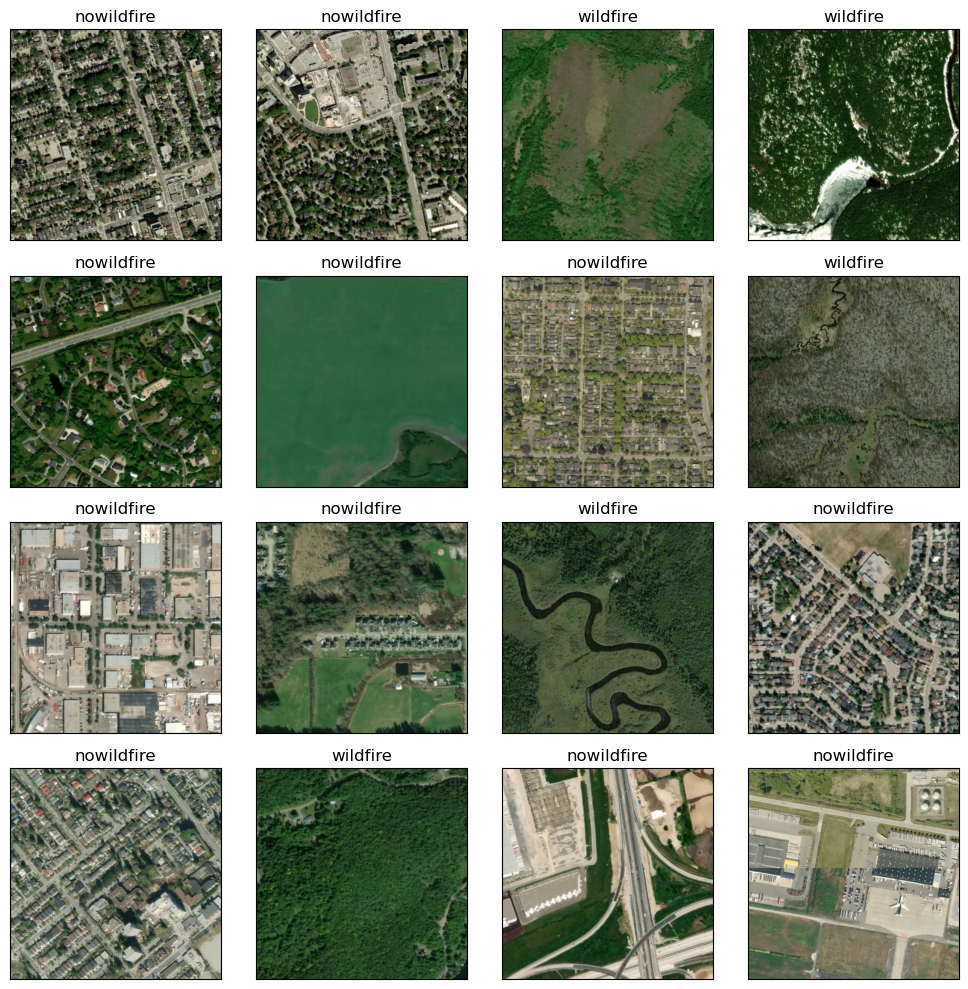

In [ ]:
show_image_sample(canada_train_df1)

In [ ]:
import cv2
import pandas as pd
from tqdm import tqdm
from skimage import exposure

def atmospheric_correction(image):
    # Split the image into its RGB components
    R, G, B = cv2.split(image)

    # Apply histogram equalization to each channel
    equalized_R = exposure.equalize_hist(R)
    equalized_G = exposure.equalize_hist(G)
    equalized_B = exposure.equalize_hist(B)

    # Merge the channels back together
    equalized_image = cv2.merge([equalized_R, equalized_G, equalized_B])
    return equalized_image

def preprocess_dataframe(df):
    processed_images = []
    for filepath in tqdm(df['Filepath'], desc='Processing Images', unit='image'):
        # Read the image in color (BGR format)
        image = cv2.imread(str(filepath), cv2.IMREAD_COLOR)

        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply Atmospheric Correction
        corrected_image = atmospheric_correction(image_rgb)

        # Add the corrected image to the list
        processed_images.append(corrected_image)

    processed_df = pd.DataFrame({
        'Processed_Image': processed_images,
        'Label': df['Label']
    })
    return processed_df


In [ ]:
canada_test_df=canada_test_df1.sample(frac=0.025,random_state=1)
canada_train_df=canada_train_df1.sample(frac=0.025,random_state=1)
canada_val_df=canada_val_df1.sample(frac=0.025,random_state=1)

In [ ]:
canada_train_processed_df = preprocess_dataframe(canada_train_df)
# canada_train_processed_df.to_csv('canada_train_processed_df.xlsx')

Processing Images: 100%|██████████| 756/756 [00:08<00:00, 93.00image/s]


In [ ]:
canada_val_processed_df = preprocess_dataframe(canada_val_df)
# canada_val_processed_df.to_csv("canada_val_processed_DDF.csv",  float_format='%g', line_terminator=',',sep=":")

Processing Images: 100%|██████████| 158/158 [00:01<00:00, 95.52image/s]


In [ ]:
import gc
gc.collect()

31487

In [ ]:
canada_test_processed_df = preprocess_dataframe(canada_test_df)
# canada_test_processed_df.to_csv("canada_test_processed_df.csv")

Processing Images: 100%|██████████| 158/158 [00:01<00:00, 94.36image/s]


In [ ]:
cali_test_df=cali_test_df.sample(frac=0.5,random_state=1)
cali_train_df=cali_train_df.sample(frac=0.5,random_state=1)
cali_val_df=cali_val_df.sample(frac=0.5,random_state=1)

In [ ]:
cali_train_processed_df = preprocess_dataframe(cali_train_df)
# cali_train_processed_df.to_csv("cali_train_processed_df.csv")

Processing Images: 100%|██████████| 996/996 [00:12<00:00, 80.21image/s]


In [ ]:
cali_val_processed_df = preprocess_dataframe(cali_val_df)
# cali_val_processed_df.to_csv("cali_val_processed_df.csv")

Processing Images: 100%|██████████| 214/214 [00:02<00:00, 79.23image/s]


In [ ]:
cali_test_processed_df = preprocess_dataframe(cali_test_df)
# cali_test_processed_df.to_csv("cali_test_processed_df.csv")

Processing Images: 100%|██████████| 214/214 [00:02<00:00, 78.00image/s]


In [ ]:
merged_train = pd.concat([cali_train_processed_df, canada_train_processed_df], ignore_index=True)

In [ ]:
merged_test = pd.concat([cali_test_processed_df, canada_test_processed_df], ignore_index=True)

In [ ]:
merged_val = pd.concat([cali_val_processed_df, canada_val_processed_df], ignore_index=True)

In [ ]:
print(cali_test_processed_df.head())

                                       Processed_Image       Label
290  [[[0.8933142857142857, 0.8698040816326531, 0.8...    wildfire
249  [[[0.7457632653061225, 0.7735755102040817, 0.7...    wildfire
63   [[[0.26124897959183674, 0.2881795918367347, 0....  nowildfire
417  [[[0.10879183673469388, 0.10008163265306122, 0...    wildfire
281  [[[0.05845714285714286, 0.11156734693877551, 0...    wildfire


In [ ]:
def show_processed_image_sample(df, num_images=16):
    selected_data = df.head(num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        image = selected_data.iloc[i]['Processed_Image']

        ax.imshow(image)
        ax.set_title("Image "+str(i))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

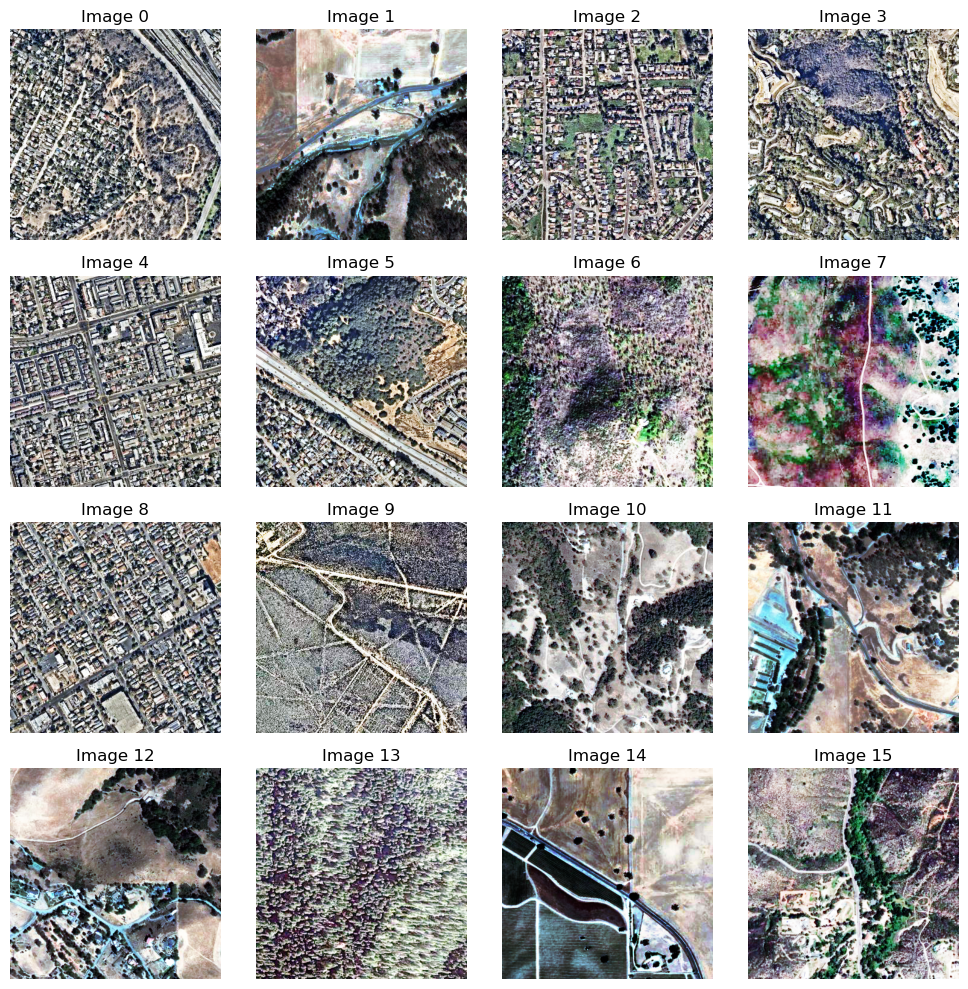

In [ ]:
show_processed_image_sample(merged_train)

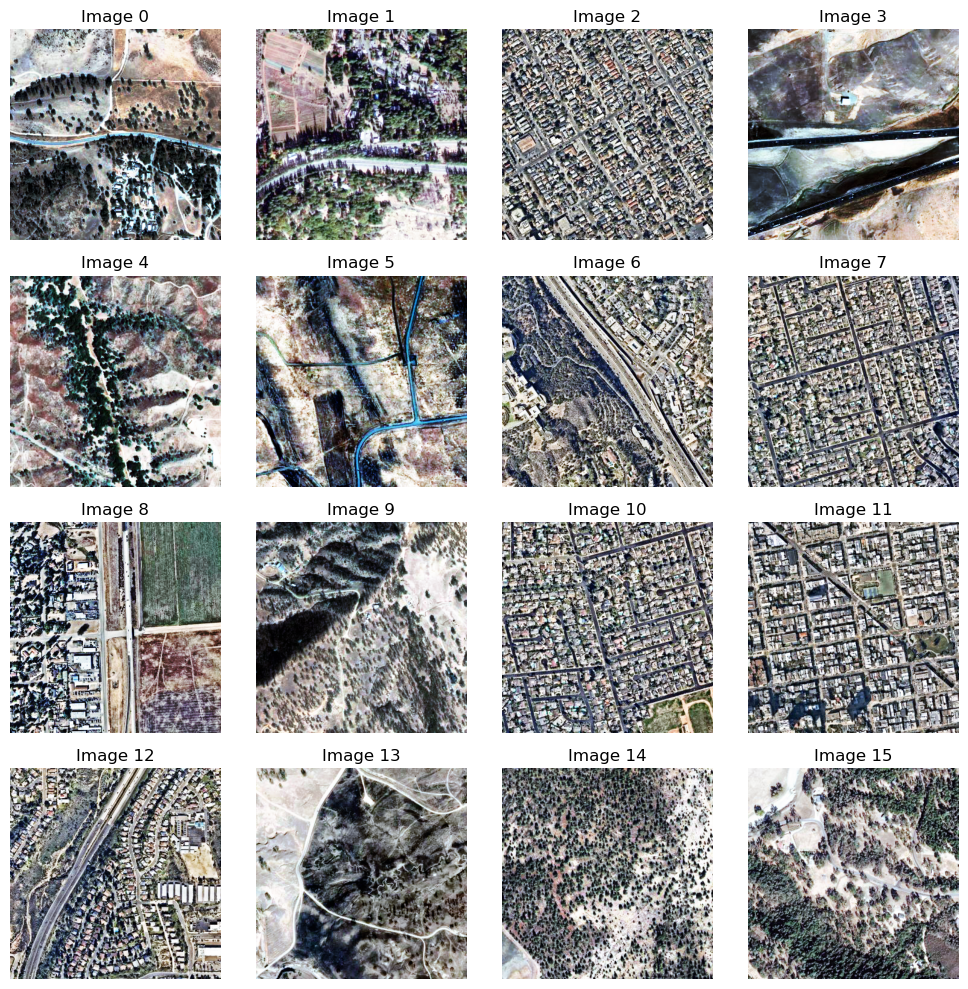

In [ ]:
show_processed_image_sample(merged_test)

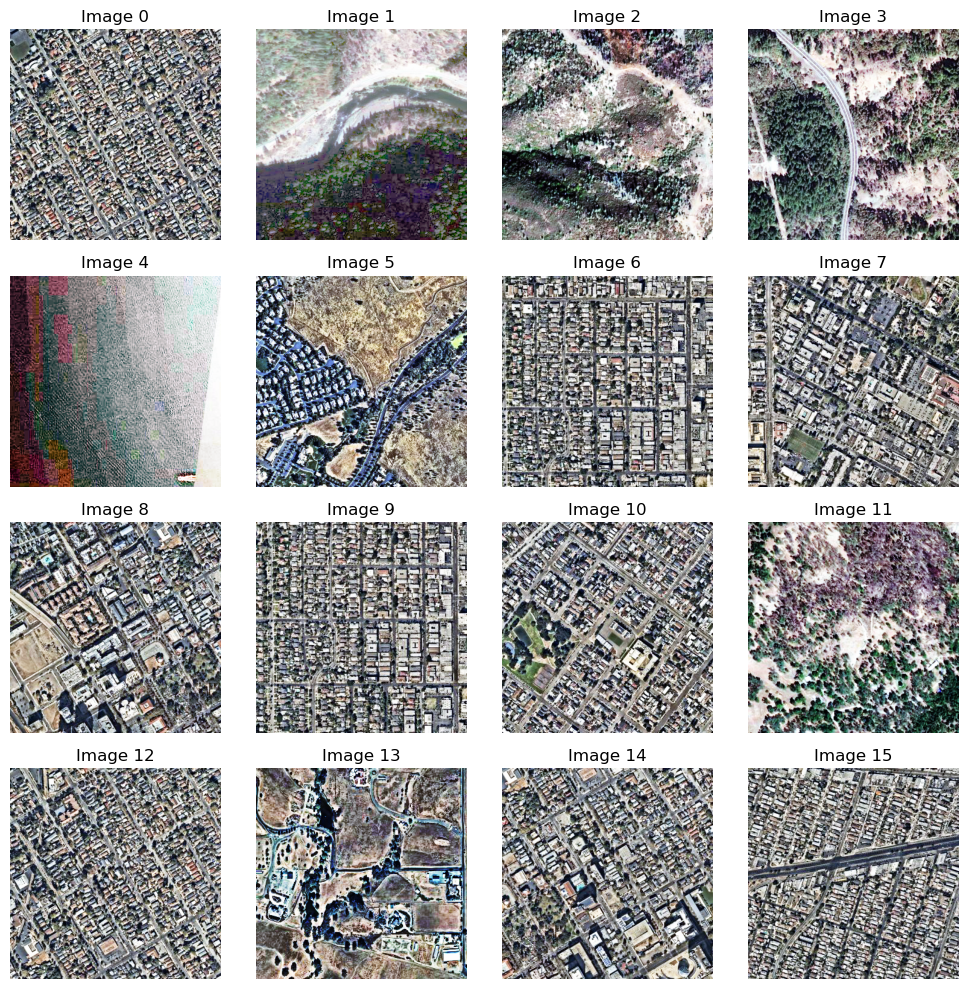

In [ ]:
show_processed_image_sample(merged_val)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
import pandas as pd

## Training on CANADA
class ImageDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        image = self.dataframe.iloc[idx]['Processed_Image'].astype(np.float32)
        label = self.dataframe.iloc[idx]['Label']
        label = 1 if label == 'wildfire' else 0

        if self.transform:
            image = self.transform(image)

        return image, label

val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train_dataset = ImageDataset(merged_train, transform=val_transform)
val_dataset = ImageDataset(merged_val, transform=val_transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

alexnet = models.alexnet(pretrained=True)
alexnet.classifier[6] = nn.Linear(4096, 2)

# Loss and optimizer with L2 regularization
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(alexnet.parameters(), lr=0.00001, weight_decay=1e-5)

# Early Stopping parameters
best_val_loss = float('inf')
patience = 5
patience_counter = 0

# Training and Validation
num_epochs = 50
for epoch in range(num_epochs):
    print("hgehgjhg")
    alexnet.train()
    for images, labels in train_loader:
        print("In training")
        outputs = alexnet(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    alexnet.eval()
    val_loss = 0
    with torch.no_grad():
        for images, labels in val_loader:
            outputs = alexnet(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

    val_loss /= len(val_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss:.4f}')

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(alexnet.state_dict(), 'best_model.pth')
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break

alexnet.load_state_dict(torch.load('best_model.pth'))

torch.save(alexnet, 'alexnet_full_model.pth')

torch.save(alexnet.state_dict(), 'alexnet_state_dict.pth')

hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [1/50], Loss: 0.6477, Val Loss: 0.6439
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
I

In [ ]:
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [1/50], Loss: 0.6477, Val Loss: 0.6439
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [2/50], Loss: 0.6010, Val Loss: 0.5969
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [3/50], Loss: 0.5619, Val Loss: 0.5581
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [4/50], Loss: 0.5281, Val Loss: 0.5249
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [5/50], Loss: 0.4987, Val Loss: 0.4970
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [6/50], Loss: 0.4730, Val Loss: 0.4726
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [7/50], Loss: 0.4494, Val Loss: 0.4511
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [8/50], Loss: 0.4282, Val Loss: 0.4323
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [9/50], Loss: 0.4089, Val Loss: 0.4158
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [10/50], Loss: 0.3913, Val Loss: 0.4010
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [11/50], Loss: 0.3751, Val Loss: 0.3875
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [12/50], Loss: 0.3611, Val Loss: 0.3757
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [13/50], Loss: 0.3479, Val Loss: 0.3651
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [14/50], Loss: 0.3351, Val Loss: 0.3554
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [15/50], Loss: 0.3229, Val Loss: 0.3464
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [16/50], Loss: 0.3123, Val Loss: 0.3381
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [17/50], Loss: 0.3023, Val Loss: 0.3307
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [18/50], Loss: 0.2926, Val Loss: 0.3238
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [19/50], Loss: 0.2836, Val Loss: 0.3176
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [20/50], Loss: 0.2756, Val Loss: 0.3117
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [21/50], Loss: 0.2677, Val Loss: 0.3064
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [22/50], Loss: 0.2603, Val Loss: 0.3013
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [23/50], Loss: 0.2535, Val Loss: 0.2967
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [24/50], Loss: 0.2473, Val Loss: 0.2924
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [25/50], Loss: 0.2410, Val Loss: 0.2884
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [26/50], Loss: 0.2353, Val Loss: 0.2847
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [27/50], Loss: 0.2296, Val Loss: 0.2812
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [28/50], Loss: 0.2238, Val Loss: 0.2779
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [29/50], Loss: 0.2187, Val Loss: 0.2748
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [30/50], Loss: 0.2142, Val Loss: 0.2719
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [31/50], Loss: 0.2095, Val Loss: 0.2690
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [32/50], Loss: 0.2053, Val Loss: 0.2664
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [33/50], Loss: 0.2011, Val Loss: 0.2639
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [34/50], Loss: 0.1970, Val Loss: 0.2616
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [35/50], Loss: 0.1932, Val Loss: 0.2593
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [36/50], Loss: 0.1896, Val Loss: 0.2571
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [37/50], Loss: 0.1860, Val Loss: 0.2551
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [38/50], Loss: 0.1826, Val Loss: 0.2532
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [39/50], Loss: 0.1796, Val Loss: 0.2513
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [40/50], Loss: 0.1763, Val Loss: 0.2497
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [41/50], Loss: 0.1737, Val Loss: 0.2481
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [42/50], Loss: 0.1709, Val Loss: 0.2465
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [43/50], Loss: 0.1684, Val Loss: 0.2449
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [44/50], Loss: 0.1658, Val Loss: 0.2434
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [45/50], Loss: 0.1631, Val Loss: 0.2420
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [46/50], Loss: 0.1608, Val Loss: 0.2406
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [47/50], Loss: 0.1584, Val Loss: 0.2393
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [48/50], Loss: 0.1565, Val Loss: 0.2380
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [49/50], Loss: 0.1544, Val Loss: 0.2368
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [50/50], Loss: 0.1521, Val Loss: 0.2357

In [ ]:
import re

# The text variable contains all the lines of text provided
text = """
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [1/50], Loss: 0.6477, Val Loss: 0.6439
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [2/50], Loss: 0.6010, Val Loss: 0.5969
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [3/50], Loss: 0.5619, Val Loss: 0.5581
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [4/50], Loss: 0.5281, Val Loss: 0.5249
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [5/50], Loss: 0.4987, Val Loss: 0.4970
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [6/50], Loss: 0.4730, Val Loss: 0.4726
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [7/50], Loss: 0.4494, Val Loss: 0.4511
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [8/50], Loss: 0.4282, Val Loss: 0.4323
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [9/50], Loss: 0.4089, Val Loss: 0.4158
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [10/50], Loss: 0.3913, Val Loss: 0.4010
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [11/50], Loss: 0.3751, Val Loss: 0.3875
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [12/50], Loss: 0.3611, Val Loss: 0.3757
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [13/50], Loss: 0.3479, Val Loss: 0.3651
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [14/50], Loss: 0.3351, Val Loss: 0.3554
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [15/50], Loss: 0.3229, Val Loss: 0.3464
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [16/50], Loss: 0.3123, Val Loss: 0.3381
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [17/50], Loss: 0.3023, Val Loss: 0.3307
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [18/50], Loss: 0.2926, Val Loss: 0.3238
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [19/50], Loss: 0.2836, Val Loss: 0.3176
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [20/50], Loss: 0.2756, Val Loss: 0.3117
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [21/50], Loss: 0.2677, Val Loss: 0.3064
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [22/50], Loss: 0.2603, Val Loss: 0.3013
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [23/50], Loss: 0.2535, Val Loss: 0.2967
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [24/50], Loss: 0.2473, Val Loss: 0.2924
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [25/50], Loss: 0.2410, Val Loss: 0.2884
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [26/50], Loss: 0.2353, Val Loss: 0.2847
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [27/50], Loss: 0.2296, Val Loss: 0.2812
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [28/50], Loss: 0.2238, Val Loss: 0.2779
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [29/50], Loss: 0.2187, Val Loss: 0.2748
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [30/50], Loss: 0.2142, Val Loss: 0.2719
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [31/50], Loss: 0.2095, Val Loss: 0.2690
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [32/50], Loss: 0.2053, Val Loss: 0.2664
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [33/50], Loss: 0.2011, Val Loss: 0.2639
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [34/50], Loss: 0.1970, Val Loss: 0.2616
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [35/50], Loss: 0.1932, Val Loss: 0.2593
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [36/50], Loss: 0.1896, Val Loss: 0.2571
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [37/50], Loss: 0.1860, Val Loss: 0.2551
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [38/50], Loss: 0.1826, Val Loss: 0.2532
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [39/50], Loss: 0.1796, Val Loss: 0.2513
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [40/50], Loss: 0.1763, Val Loss: 0.2497
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [41/50], Loss: 0.1737, Val Loss: 0.2481
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [42/50], Loss: 0.1709, Val Loss: 0.2465
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [43/50], Loss: 0.1684, Val Loss: 0.2449
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [44/50], Loss: 0.1658, Val Loss: 0.2434
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [45/50], Loss: 0.1631, Val Loss: 0.2420
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [46/50], Loss: 0.1608, Val Loss: 0.2406
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [47/50], Loss: 0.1584, Val Loss: 0.2393
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [48/50], Loss: 0.1565, Val Loss: 0.2380
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [49/50], Loss: 0.1544, Val Loss: 0.2368
hgehgjhg
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
In training
Epoch [50/50], Loss: 0.1521, Val Loss: 0.2357
"""

# This regular expression matches lines that start with "Epoch" followed by the rest of the expected information
epoch_lines = re.findall(r'Epoch \[\d+/\d+\], Loss: \d+\.\d+, Val Loss: \d+\.\d+', text)

# Join the matched lines into a single string with each epoch on a new line
epoch_text = "\n".join(epoch_lines)

print(epoch_text)


Epoch [1/50], Loss: 0.6477, Val Loss: 0.6439
Epoch [2/50], Loss: 0.6010, Val Loss: 0.5969
Epoch [3/50], Loss: 0.5619, Val Loss: 0.5581
Epoch [4/50], Loss: 0.5281, Val Loss: 0.5249
Epoch [5/50], Loss: 0.4987, Val Loss: 0.4970
Epoch [6/50], Loss: 0.4730, Val Loss: 0.4726
Epoch [7/50], Loss: 0.4494, Val Loss: 0.4511
Epoch [8/50], Loss: 0.4282, Val Loss: 0.4323
Epoch [9/50], Loss: 0.4089, Val Loss: 0.4158
Epoch [10/50], Loss: 0.3913, Val Loss: 0.4010
Epoch [11/50], Loss: 0.3751, Val Loss: 0.3875
Epoch [12/50], Loss: 0.3611, Val Loss: 0.3757
Epoch [13/50], Loss: 0.3479, Val Loss: 0.3651
Epoch [14/50], Loss: 0.3351, Val Loss: 0.3554
Epoch [15/50], Loss: 0.3229, Val Loss: 0.3464
Epoch [16/50], Loss: 0.3123, Val Loss: 0.3381
Epoch [17/50], Loss: 0.3023, Val Loss: 0.3307
Epoch [18/50], Loss: 0.2926, Val Loss: 0.3238
Epoch [19/50], Loss: 0.2836, Val Loss: 0.3176
Epoch [20/50], Loss: 0.2756, Val Loss: 0.3117
Epoch [21/50], Loss: 0.2677, Val Loss: 0.3064
Epoch [22/50], Loss: 0.2603, Val Loss: 0.30

In [ ]:


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torch.utils.data import DataLoader

def evaluate_model(model, dataloader):
    model.eval()

    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in dataloader:
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels)
            all_preds.extend(predicted)

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='binary')
    recall = recall_score(all_labels, all_preds, average='binary')
    f1 = f1_score(all_labels, all_preds, average='binary')

    return accuracy, precision, recall, f1

alexnet.load_state_dict(torch.load('best_model.pth'))

accuracy, precision, recall, f1 = evaluate_model(alexnet, val_loader)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Accuracy: 0.9274
Precision: 0.9183
Recall: 0.9502
F1-Score: 0.9340


In [ ]:
# Test on CANADA
test_dataset = ImageDataset(canada_test_processed_df, transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Evaluate on Test set
accuracy, precision, recall, f1 = evaluate_model(alexnet, test_loader)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Accuracy: 0.9241
Precision: 0.9011
Recall: 0.9647
F1-Score: 0.9318


In [ ]:
# Test on california
test_dataset = ImageDataset(cali_test_processed_df, transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Evaluate on Test set
accuracy, precision, recall, f1 = evaluate_model(alexnet, test_loader)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Accuracy: 0.9533
Precision: 0.9636
Recall: 0.9464
F1-Score: 0.9550


In [ ]:
# Test on merged
test_dataset = ImageDataset(merged_test, transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Evaluate on Test set
accuracy, precision, recall, f1 = evaluate_model(alexnet, test_loader)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Accuracy: 0.9409
Precision: 0.9353
Recall: 0.9543
F1-Score: 0.9447


In [ ]:
loss=[0.6477, 0.601, 0.5619, 0.5281, 0.4987, 0.473, 0.4494, 0.4282, 0.4089, 0.3913, 0.3751, 0.3611, 0.3479, 0.3351, 0.3229, 0.3123, 0.3023, 0.2926, 0.2836, 0.2756, 0.2677, 0.2603, 0.2535, 0.2473, 0.241, 0.2353, 0.2296, 0.2238, 0.2187, 0.2142, 0.2095, 0.2053, 0.2011, 0.197, 0.1932, 0.1896, 0.186, 0.1826, 0.1796, 0.1763, 0.1737, 0.1709, 0.1684, 0.1658, 0.1631, 0.1608, 0.1584, 0.1565, 0.1544, 0.1521]
val_loss=[0.6439, 0.5969, 0.5581, 0.5249, 0.497, 0.4726, 0.4511, 0.4323, 0.4158, 0.401, 0.3875, 0.3757, 0.3651, 0.3554, 0.3464, 0.3381, 0.3307, 0.3238, 0.3176, 0.3117, 0.3064, 0.3013, 0.2967, 0.2924, 0.2884, 0.2847, 0.2812, 0.2779, 0.2748, 0.2719, 0.269, 0.2664, 0.2639, 0.2616, 0.2593, 0.2571, 0.2551, 0.2532, 0.2513, 0.2497, 0.2481, 0.2465, 0.2449, 0.2434, 0.242, 0.2406, 0.2393, 0.238, 0.2368, 0.2357]

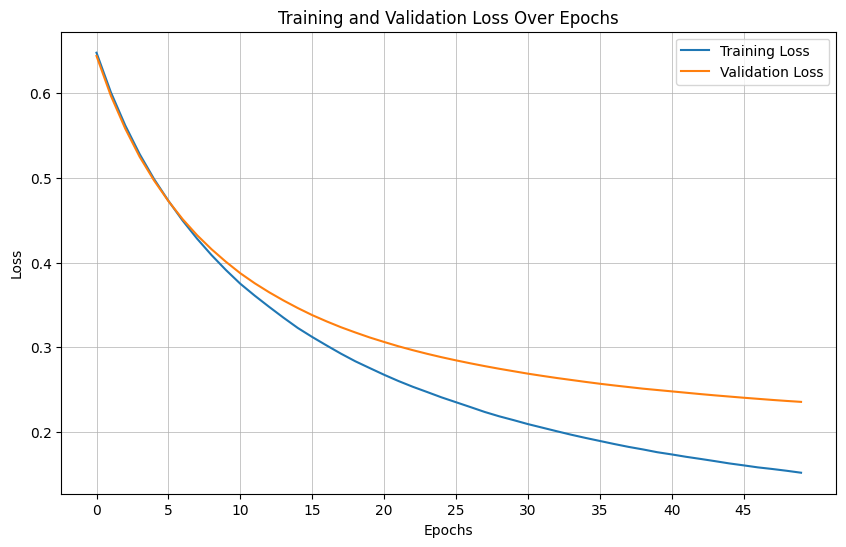

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(linestyle='-', linewidth=0.5)
plt.xticks(range(0, 50, 5))
plt.legend()
plt.show()
